In [95]:
import numpy as np 
import pandas as pd 
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score , confusion_matrix , classification_report
from termcolor import colored
import plotly
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

# 💻Reading Data

In [96]:
data = pd.read_csv("winequality-red.csv")
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [97]:
dataset_rows = data.head(7)

print(colored("the first 7 rows in the dataset"))

for index , row in dataset_rows.iterrows():#iterate throught rows
    print(colored(f"Row{index+1} : ","white",attrs=["reverse"]))
    
    print(row)
    
    print("---------------------------------------------")
    

the first 7 rows in the dataset
Row1 : 
fixed acidity            7.4000
volatile acidity         0.7000
citric acid              0.0000
residual sugar           1.9000
chlorides                0.0760
free sulfur dioxide     11.0000
total sulfur dioxide    34.0000
density                  0.9978
pH                       3.5100
sulphates                0.5600
alcohol                  9.4000
quality                  5.0000
Name: 0, dtype: float64
---------------------------------------------
Row2 : 
fixed acidity            7.8000
volatile acidity         0.8800
citric acid              0.0000
residual sugar           2.6000
chlorides                0.0980
free sulfur dioxide     25.0000
total sulfur dioxide    67.0000
density                  0.9968
pH                       3.2000
sulphates                0.6800
alcohol                  9.8000
quality                  5.0000
Name: 1, dtype: float64
---------------------------------------------
Row3 : 
fixed acidity            7.800
volat

In [98]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [99]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
volatile acidity,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000
citric acid,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
residual sugar,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
chlorides,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100
free sulfur dioxide,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
total sulfur dioxide,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
density,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
pH,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
sulphates,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


In [7]:
data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [100]:
data.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [101]:
data.duplicated().sum()

240

In [60]:
#data.drop_duplicates()
#data.shape

In [62]:
data.corr()["quality"].sort_values(ascending=False)[1:]

alcohol                 0.476166
sulphates               0.251397
citric acid             0.226373
fixed acidity           0.124052
residual sugar          0.013732
free sulfur dioxide    -0.050656
pH                     -0.057731
chlorides              -0.128907
density                -0.174919
total sulfur dioxide   -0.185100
volatile acidity       -0.390558
Name: quality, dtype: float64

# 📋 EDA

In [63]:
fig = px.violin(data,x="quality",y="fixed acidity",title="Fixed acidity not giving any specifications about quality")
fig.show()

During the visualizations, also features like residual sugar, free sulpher dioxide, total sulpher dioxide, pH and density didn't give any specifications aboout the quality. So, I didn't plot them.

In [64]:
fig = px.violin(data,x="quality",y="volatile acidity",title="Quality imporves as volatile acidity composition decrease")
fig.show()

Text(0.5, 1.0, 'Quality goes higher as Critic acid increases')

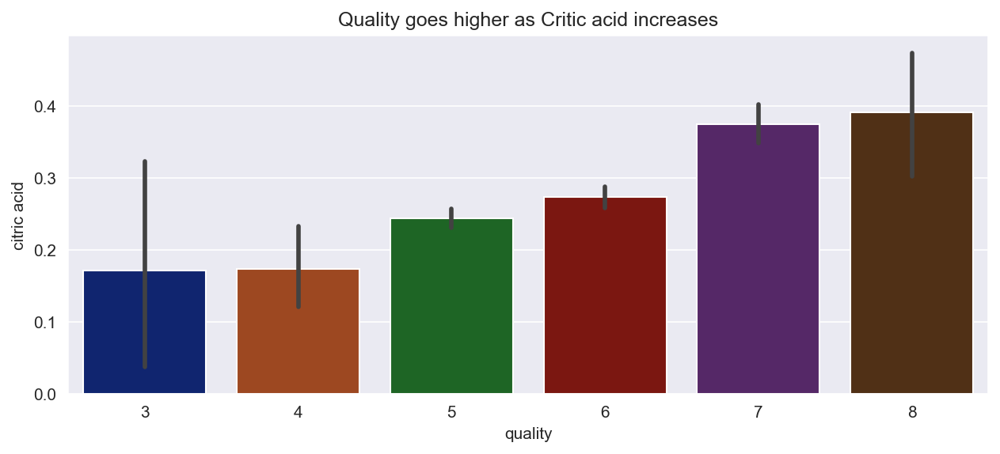

In [65]:
plt.figure(figsize=(10,4),dpi=150)
sns.barplot(x="quality",y="citric acid",data=data)
plt.title('Quality goes higher as Critic acid increases')

Text(0.5, 1.0, 'Composition of Chloride descends as Quality improves')

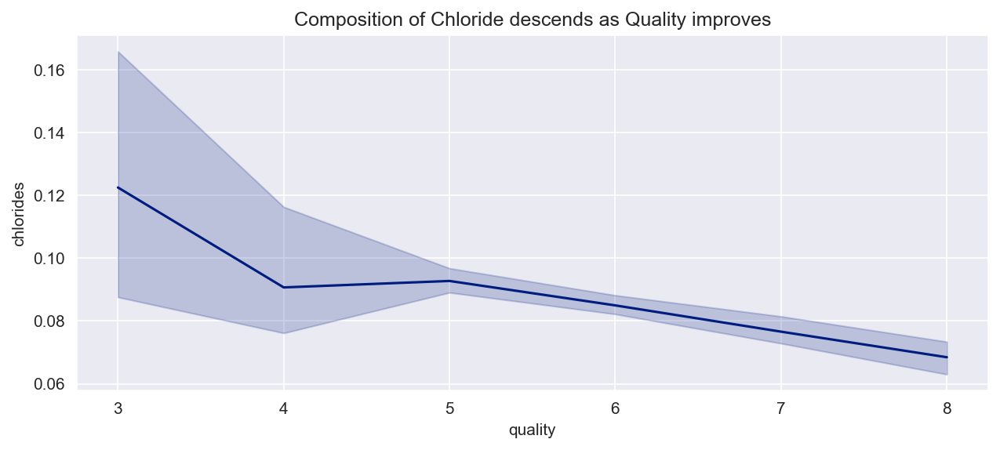

In [66]:
sns.set_style('darkgrid')
plt.figure(figsize=(10,4),dpi=150)
sns.lineplot(x = 'quality', y = 'chlorides', data =data)
plt.title('Composition of Chloride descends as Quality improves')

Text(0.5, 1.0, 'Sulphates level goes higher with the quality of wine')

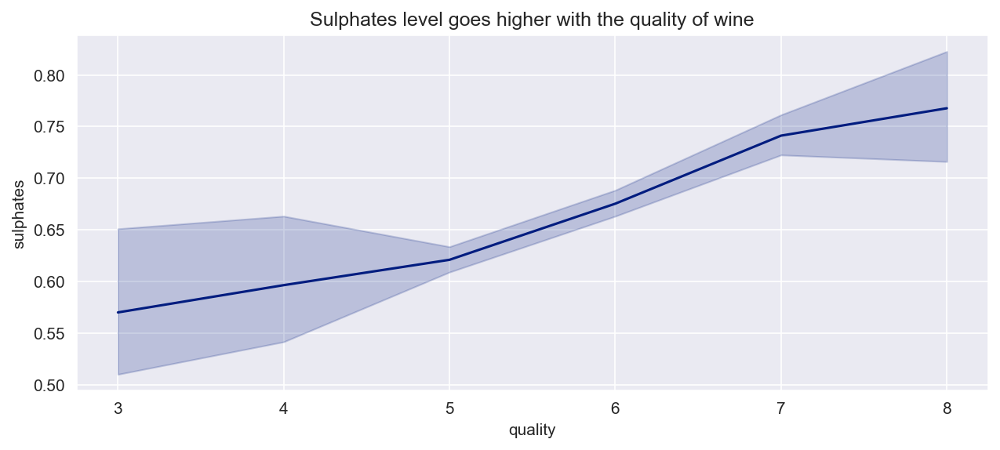

In [67]:
sns.set_style('darkgrid')
plt.figure(figsize=(10,4),dpi=150)
sns.lineplot(x = 'quality', y = 'sulphates', data =data)
plt.title('Sulphates level goes higher with the quality of wine')

Text(0.5, 1.0, 'Alcohol level goes higher with the quality of wine')

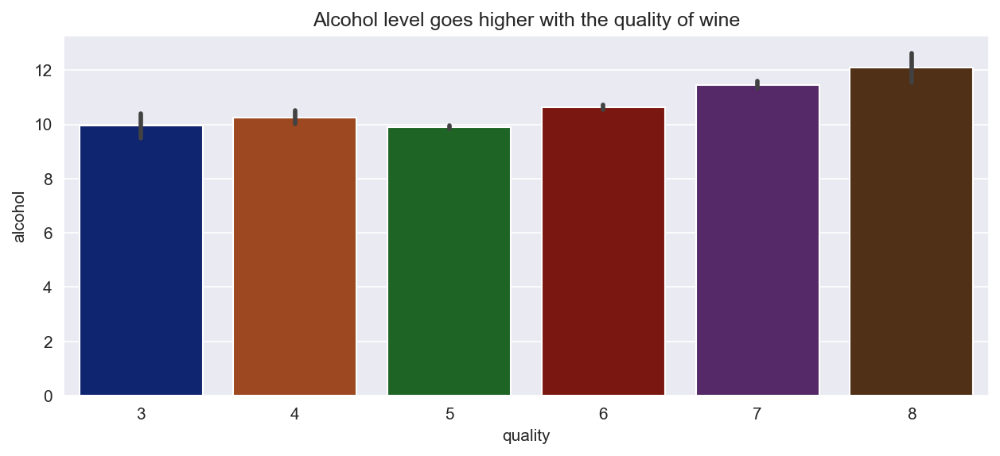

In [68]:
plt.figure(figsize=(10,4),dpi=150)
sns.barplot(x = 'quality', y = 'alcohol', data = data)
plt.title('Alcohol level goes higher with the quality of wine')

# Lets summarize what we can infer from above analysis

1.With the increase of the quality score, the composition of chlorides and volatile acidity decreases.
2.With the increase for quality score, the compostion of alcohol, sulphates and citric acid increases

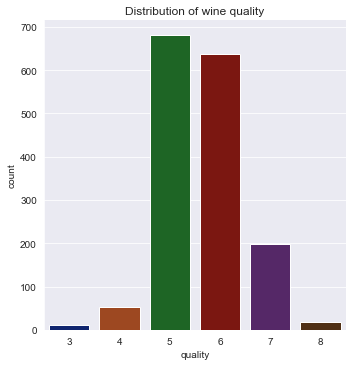

In [69]:
sns.catplot(data=data,x="quality",kind="count")

plt.title("Distribution of wine quality")
plt.xlabel("quality")
plt.ylabel("count")

plt.show()

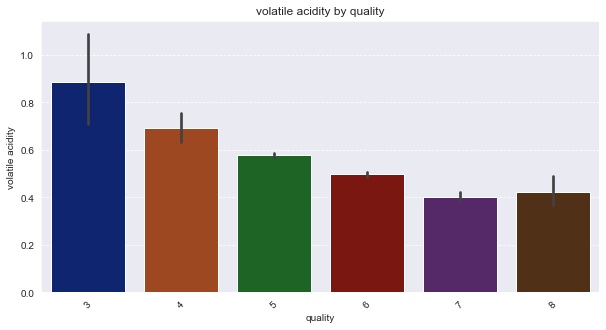

In [70]:
fig,ax = plt.subplots(figsize=(10,5))

sns.barplot(x='quality', y='volatile acidity', data=data, ax=ax)

ax.set_title("volatile acidity by quality")
ax.set_xlabel("quality")
ax.set_ylabel("volatile acidity")

ax.grid(True,axis="y",linestyle="--")
sns.set_palette("dark")
plt.xticks(rotation=45)

plt.show()

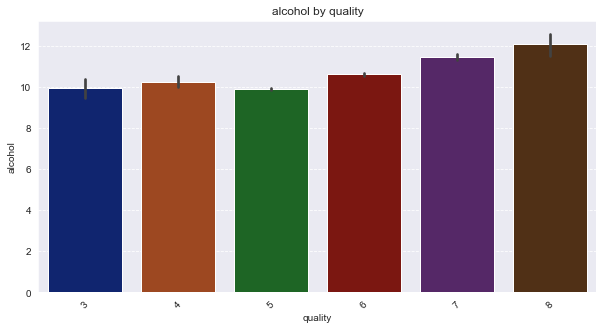

In [71]:
fig,ax = plt.subplots(figsize=(10,5))

sns.barplot(x='quality', y='alcohol', data=data, ax=ax)

ax.set_title("alcohol by quality")
ax.set_xlabel("quality")
ax.set_ylabel("alcohol")

ax.grid(True,axis="y",linestyle="--")
sns.set_palette("dark")
plt.xticks(rotation=45)

plt.show()

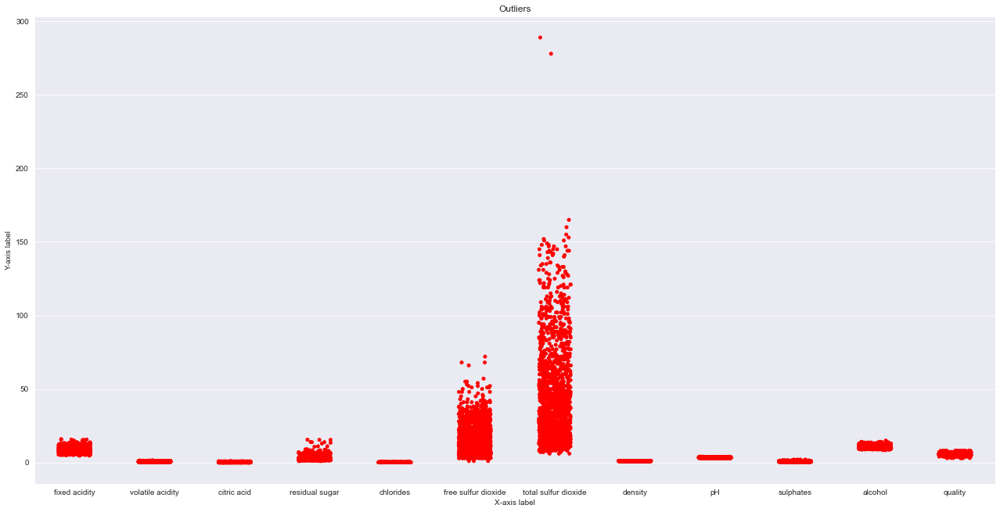

In [72]:
# Set the figure size
plt.figure(figsize=(22, 11))

# Add outliers to the plot
sns.stripplot(data=data, color="red", jitter=0.2, size=5)

# Set the axis labels and title
plt.title("Outliers")
plt.xlabel("X-axis label")
plt.ylabel("Y-axis label")

# Show the plot
plt.show()

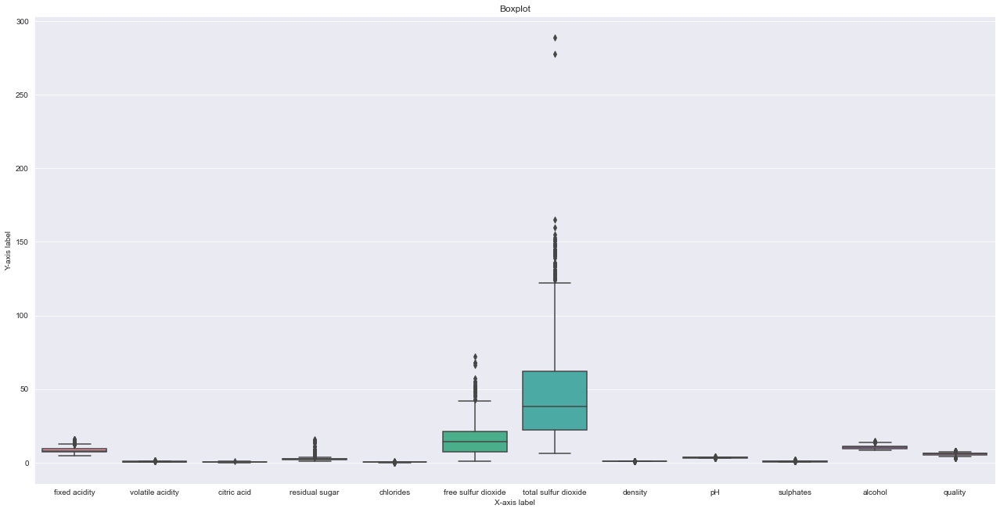

In [73]:
# Set the figure size
plt.figure(figsize=(22, 11))

# Add outliers to the plot
sns.boxplot(data=data)

# Set the axis labels and title
plt.title("Boxplot")
plt.xlabel("X-axis label")
plt.ylabel("Y-axis label")

# Show the plot
plt.show()

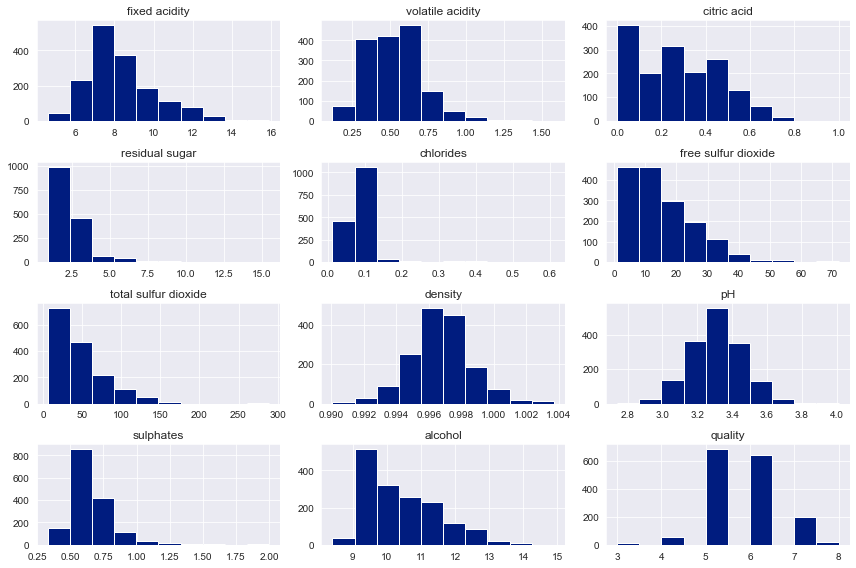

In [74]:
data.hist(figsize=(12,8))
plt.tight_layout()
plt.show()

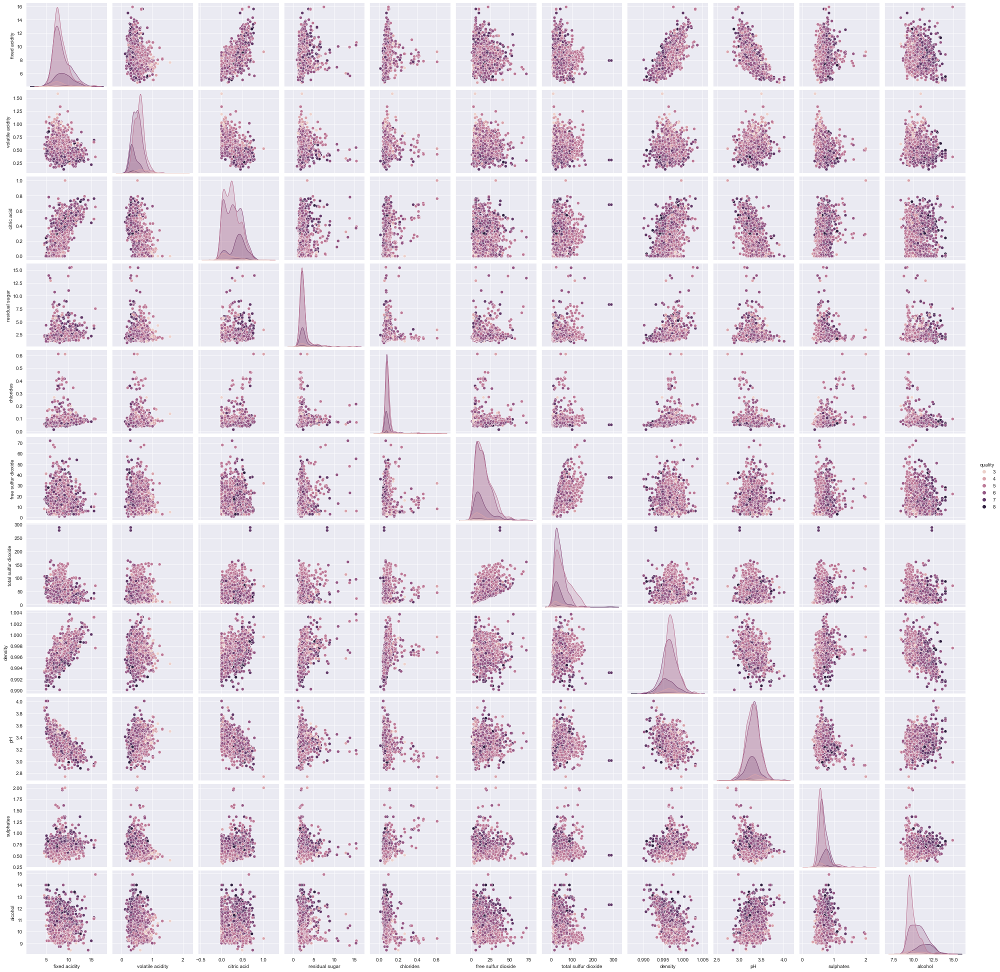

In [75]:
sns.pairplot(data,hue="quality")

plt.show()

In [79]:
data["quality"].value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

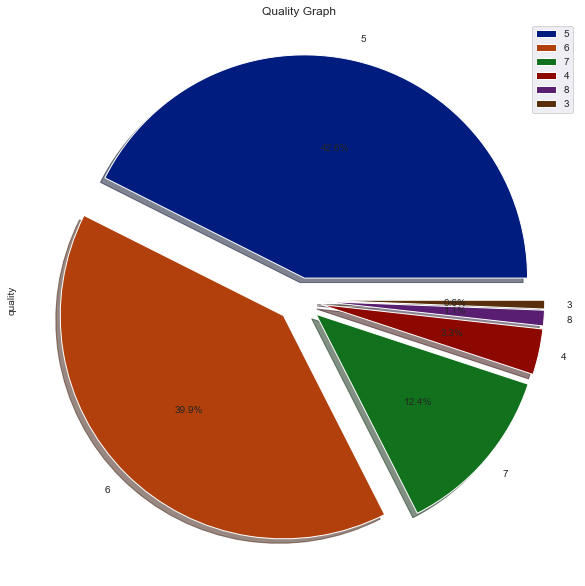

In [80]:
# Create a pie chart to visualize the distribution of values in the 'quality' column of the 'data' DataFrame
data.quality.value_counts().plot.pie(autopct='%1.1f%%', shadow=True, figsize=(10, 15),explode=[0.1,0.1,0.1,0.1,0.1,0.1])

# Add a title for the graph
plt.title('Quality Graph')

#To add a list of explanation for each wedge
plt.legend()

# Display the pie chart
plt.show()

<AxesSubplot:>

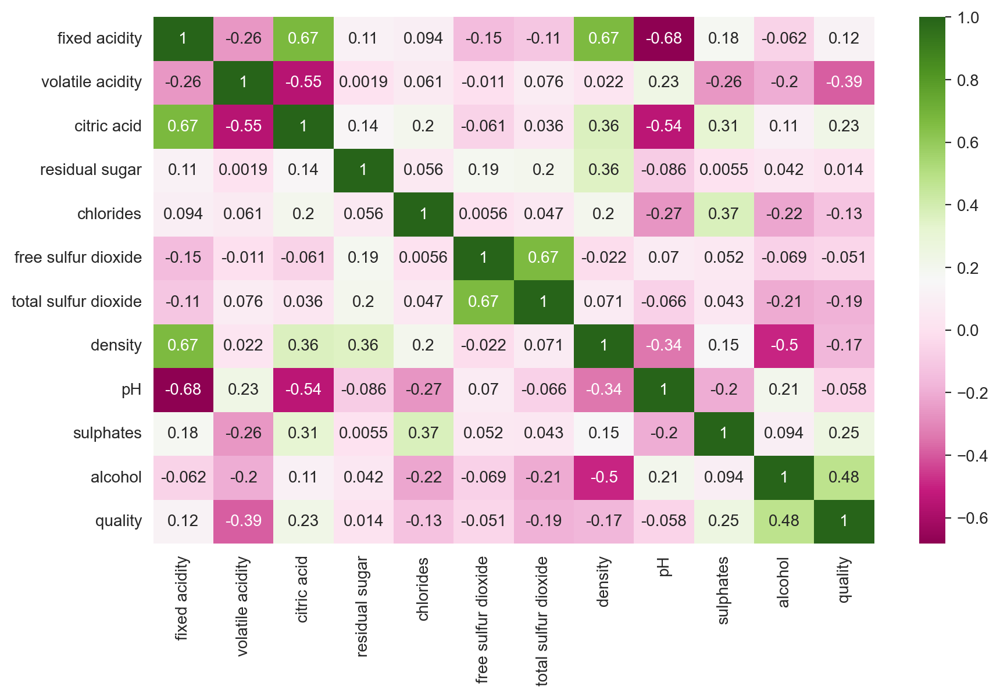

In [81]:
plt.figure(figsize=(10,6),dpi=200)
sns.heatmap(data.corr(),cmap="PiYG",annot=True)

# Train Test split and Preprocessing

In [115]:
x = data.drop("quality",axis=1)
y = data['quality'].apply(lambda y_value: 1 if y_value >= 5 else 0)

# Print the resulting series 'Y'
print(y)

0       1
1       1
2       1
3       1
4       1
       ..
1594    1
1595    1
1596    1
1597    1
1598    1
Name: quality, Length: 1599, dtype: int64


In [117]:
# Split the dataset into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=44)
print(y.shape, y_train.shape, y_test.shape)

(1599,) (1279,) (320,)


In [118]:
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

# Logistic Regression

In [119]:
model_lr = LogisticRegression()
model_lr.fit(x_train,y_train)

LogisticRegression()

In [120]:
y_pred_lc = model_lr.predict(x_test)

In [121]:
model_lr_acc = accuracy_score(y_test,y_pred_lc)
print(f"Accuracy Score is {model_lr_acc}")

Accuracy Score is 0.953125


# Decision Tree

In [122]:
model_DT = DecisionTreeClassifier()
model_DT.fit(x_train,y_train)

DecisionTreeClassifier()

In [123]:
y_pred_DT = model_DT.predict(x_test)

In [124]:
model_DT_acc = accuracy_score(y_test,y_pred_DT)
print(f"Accuracy score is : {model_DT_acc}")

Accuracy score is : 0.928125


# Random Forest

In [125]:
model_RF = RandomForestClassifier()
model_RF.fit(x_train,y_train)

RandomForestClassifier()

In [126]:
# Make predictions on the test set
X_test_prediction = model_RF.predict(x_test)
test_data_accuracy = accuracy_score(X_test_prediction, y_test)
print('Accuracy : ', test_data_accuracy)

Accuracy :  0.953125


# Final Comparison

In [129]:
# Now Let's take a look at which model is performing the best
models = pd.DataFrame({
    'Model' : ['Logistic Regression', 'Decision Tree', 'Random Forest'],
    'Score' : [model_lr_acc,model_DT_acc,test_data_accuracy]
})


models.sort_values(by = 'Score', ascending = False)

,Model,Score
0,Logistic Regression,0.953125
2,Random Forest,0.953125
1,Decision Tree,0.928125
